# Preprocessing

Preprocessing starts  upon importing the files!  Recall our previous result.  Now, let's go through and apply basic preprocessing, starting with filtering:

Extracting EDF parameters from f:\WEBSITE\EDF_analysis\EDF+\103918\103918.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 143999  =      0.000 ...  1124.992 secs...
Lets compare with and without dc removed:


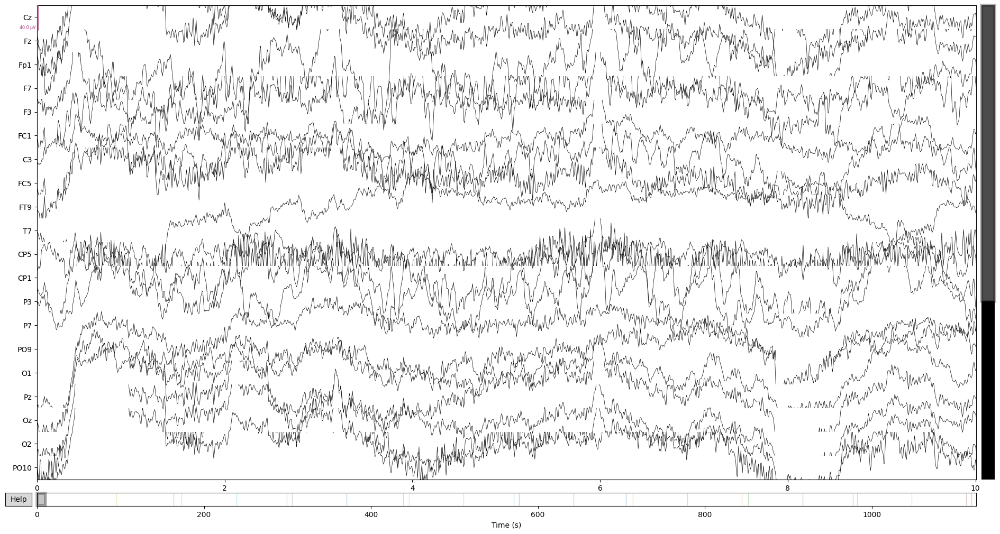

DC removed:
Notice that removing the DC drifts
 makes more data fit on the graph!




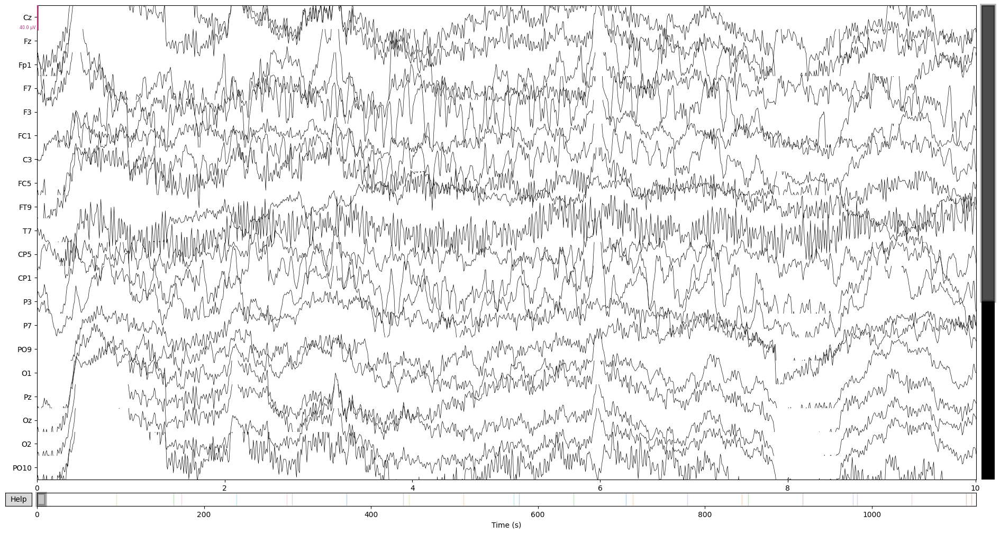

Let's filter the raw so that we can see how much it improves the signal!
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 423 samples (3.305 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.4s


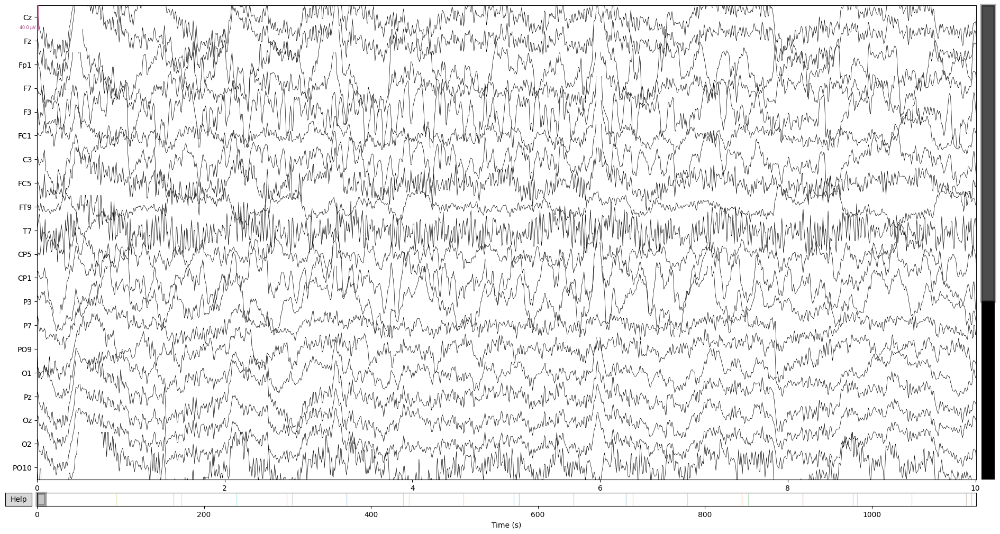

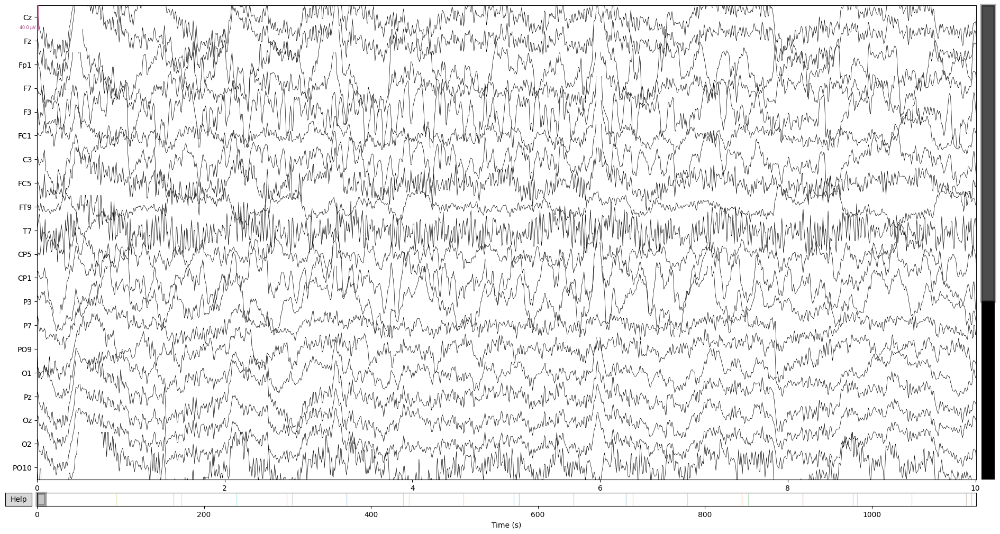

In [15]:
import mne

## Definitions:

# Define eeg channels for when we need to pass them explicitly as arguments
eeg_channels = ['Cz', 'Fz', 'Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 'CP5', 'CP1', 'P3', 'P7', 'PO9', 'O1', 'Pz', 'Oz', 'O2', 'PO10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4', 'F8', 'Fp2']
eog_channels=['Fp1', 'Fp2']


### Syntax: mne.io.read_raw_edf(r'file', eog=[list of eog channels], preload=True, speed things up, infer_types=True, discover channel types) 
#raw = mne.io.read_raw_edf(r'EDF+\103918\103918.edf', eog=['Fp1', 'Fp2'], preload=True, infer_types=True) ##NOTE: YOU MUST watch the capitalization!
raw = mne.io.read_raw_edf(
    r'EDF+\103918\103918.edf',
    #eog=['Fp1', 'Fp2'], # Define eog channels!  I suggest trying making a copy of these as eog1 and eog2
    misc=None, # List of channel names to be considered as miscellaneous (MISC) channels.
    stim_channel=None,  # Set to None if you don't have a stim channel
    exclude=[],  # Exclude channels you don't want
    preload=True,  # Preload data into memory to speed things up
    infer_types=True,  # Infer channel types from names
    verbose=True  # Set verbosity / output messages
    )

raw.pick('eeg') # Pick only eeg related data!  However, we still have more data then we need!  We'll plot only the channels we want
# raw.plot(picks=(eog_channels + eeg_channels), block=True) #Block must be True if working interactively with a .py file.  Also, we are picking only eeg channels

print('Lets compare with and without dc removed:')
raw.pick('eeg').plot(picks=(eog_channels + eeg_channels), title = 'Raw Data',block=True, remove_dc=False) # Pick only eeg related data!  However, we still have more data then we need!  We'll plot only the channels we want
print('DC removed:')
print('Notice that removing the DC drifts\n makes more data fit on the graph!\n\n')
raw.pick('eeg').plot(picks=(eog_channels + eeg_channels), title = 'Raw Data',block=True) # Pick only eeg related data!  However, we still have more data then we need!  We'll plot only the channels we want
print("Let's filter the raw so that we can see how much it improves the signal!")
filtered = raw.copy().filter(l_freq=1, h_freq=40)
# filtered.pick('eeg') # Pick only eeg related data!  However, we still have more data then we need!  We'll plot only the channels we want
filtered.pick('eeg').plot(picks=(eog_channels + eeg_channels), title = 'Filtered Data',block=True) # Pick only eeg related data!  However, we still have more data then we need!  We'll plot only the channels we want

# raw #Block must be True if working interactively with a .py file.  Also, we are picking only eeg channels

We can see a profound difference even with simple filtering!
Now, we can try a simple case of performing independent component analysis
on the overall data.  

Extracting EDF parameters from f:\WEBSITE\EDF_analysis\EDF+\103918\103918.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 143999  =      0.000 ...  1124.992 secs...
Lets compare with and without dc removed:


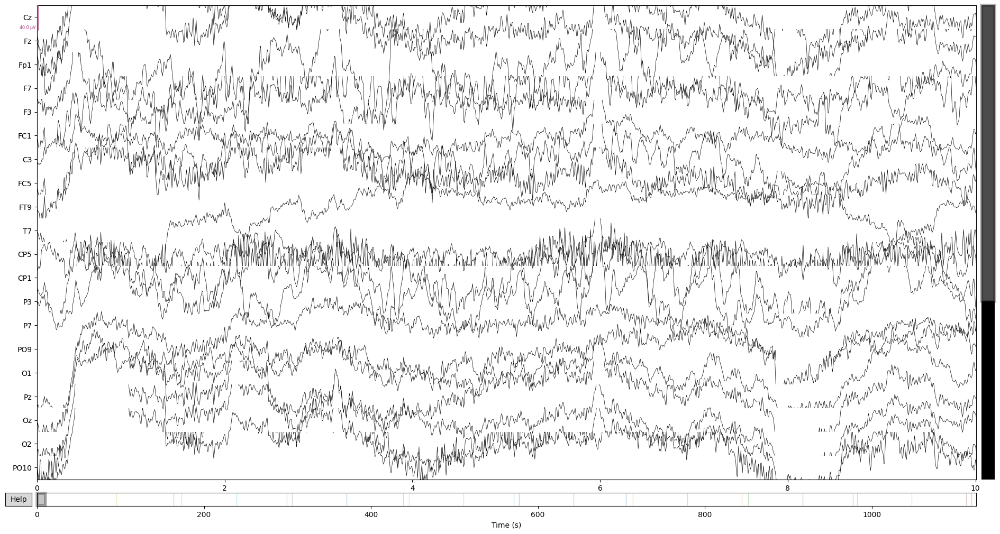

DC removed:
Notice that removing the DC drifts
 makes more data fit on the graph!




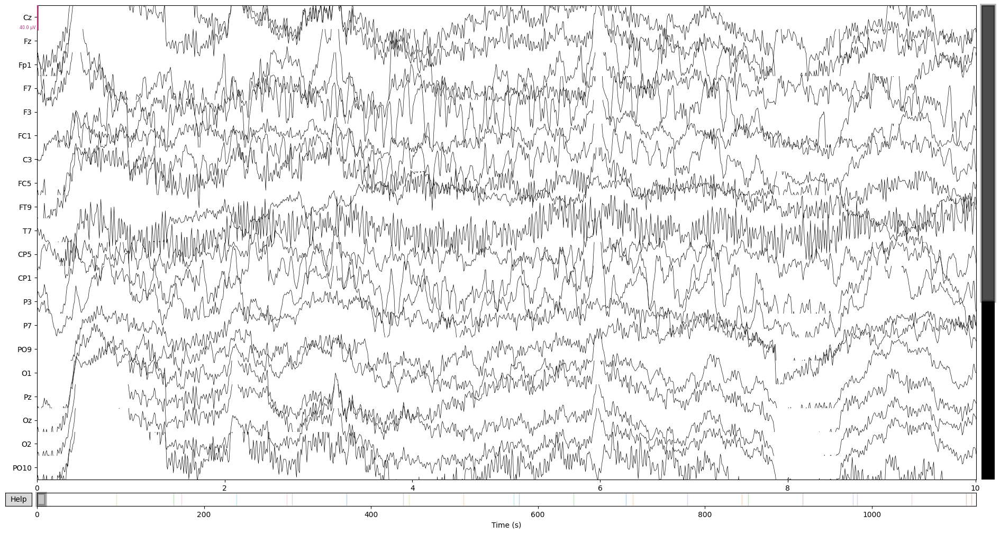

Let's filter the raw so that we can see how much it improves the signal!
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 423 samples (3.305 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.5s


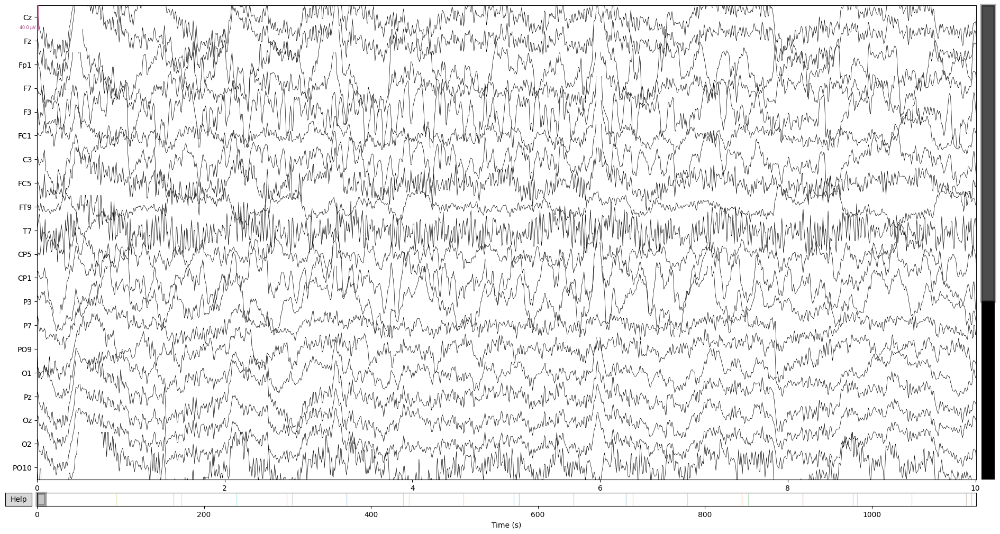

Fitting ICA to data using 127 channels (please be patient, this may take a while)
Selecting by number: 32 components


C:\Users\Admin\AppData\Local\Temp\ipykernel_9460\277521320.py:39: RuntimeWarning: Using n_components=32 (resulting in n_components_=32) may lead to an unstable mixing matrix estimation because the ratio between the largest (1.2e+02) and smallest (2.8e-07) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 10
  ica.fit(filtered)


Fitting ICA took 8.6s.
Using EOG channels: Fp1, Fp2
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB c

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 sam

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Effective window size : 16.000 (s)
Applying ICA to Raw instance
    Transforming to ICA space (32 components)
    Zeroing out 1 ICA component
    Projecting back using 127 PCA components


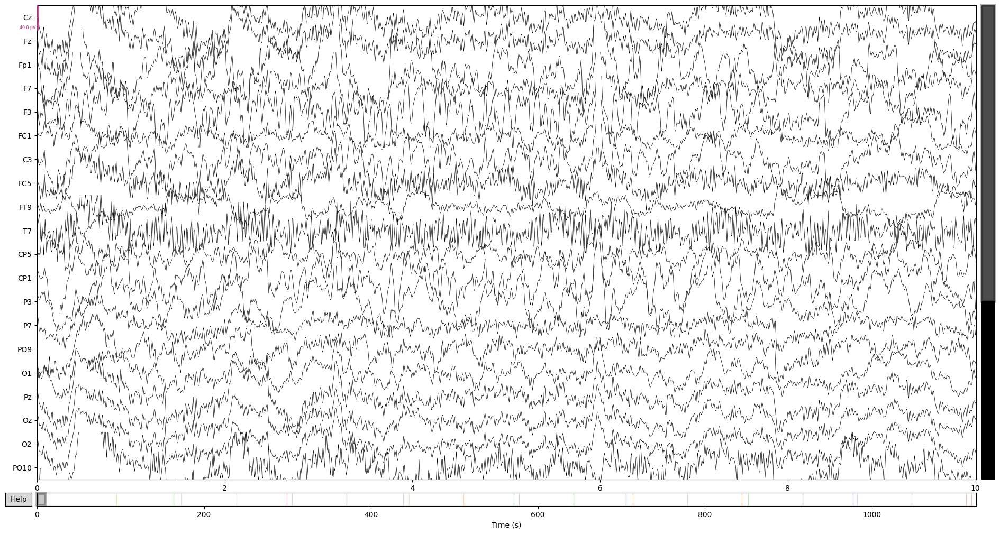

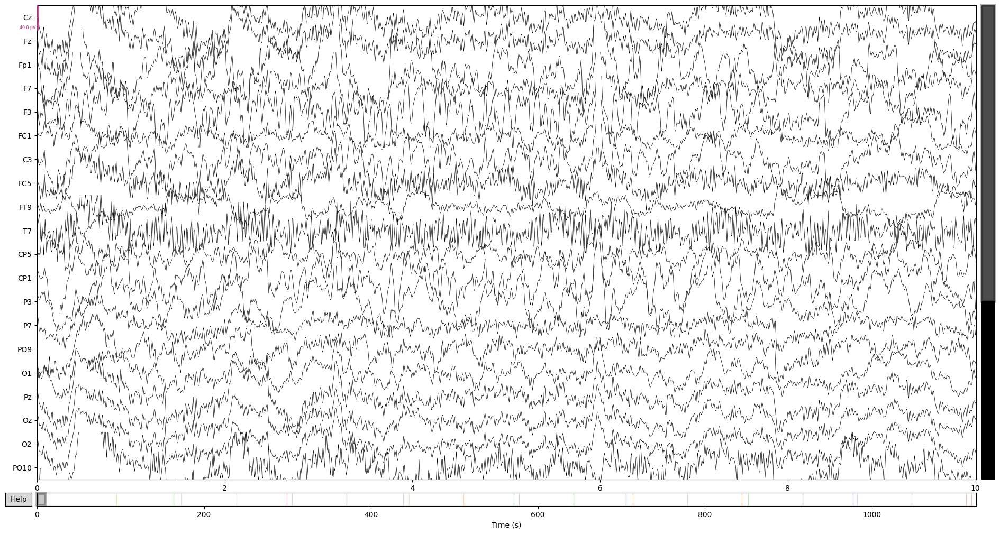

In [2]:
import mne
from mne.preprocessing import ICA  # Import it explicitly to minimize required code and refer to it more easily


## Definitions:

# Define eeg channels for when we need to pass them explicitly as arguments
eeg_channels = ['Cz', 'Fz', 'Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 'CP5', 'CP1', 'P3', 'P7', 'PO9', 'O1', 'Pz', 'Oz', 'O2', 'PO10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4', 'F8', 'Fp2']
eog_channels=['Fp1', 'Fp2']


### Syntax: mne.io.read_raw_edf(r'file', eog=[list of eog channels], preload=True, speed things up, infer_types=True, discover channel types) 
#raw = mne.io.read_raw_edf(r'EDF+\103918\103918.edf', eog=['Fp1', 'Fp2'], preload=True, infer_types=True) ##NOTE: YOU MUST watch the capitalization!
raw = mne.io.read_raw_edf(
    r'EDF+\103918\103918.edf',
    #eog=['Fp1', 'Fp2'], # Define eog channels!  I suggest trying making a copy of these as eog1 and eog2
    misc=None, # List of channel names to be considered as miscellaneous (MISC) channels.
    stim_channel=None,  # Set to None if you don't have a stim channel
    exclude=[],  # Exclude channels you don't want
    preload=True,  # Preload data into memory to speed things up
    infer_types=True,  # Infer channel types from names
    verbose=True  # Set verbosity / output messages
    )
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage, on_missing='ignore')
raw.pick('eeg') # Pick only eeg related data!  However, we still have more data then we need!  We'll plot only the channels we want
# raw.plot(picks=(eog_channels + eeg_channels), block=True) #Block must be True if working interactively with a .py file.  Also, we are picking only eeg channels

print('Lets compare with and without dc removed:')
raw.pick('eeg').plot(picks=(eog_channels + eeg_channels), title = 'Raw Data',block=True, remove_dc=False) # Pick only eeg related data!  However, we still have more data then we need!  We'll plot only the channels we want
print('DC removed:')
print('Notice that removing the DC drifts\n makes more data fit on the graph!\n\n')
raw.pick('eeg').plot(picks=(eog_channels + eeg_channels), title = 'Raw Data',block=True) # Pick only eeg related data!  However, we still have more data then we need!  We'll plot only the channels we want
print("Let's filter the raw so that we can see how much it improves the signal!")
filtered = raw.copy().filter(l_freq=1, h_freq=40)
# filtered.pick('eeg') # Pick only eeg related data!  However, we still have more data then we need!  We'll plot only the channels we want
filtered.pick('eeg').plot(picks=(eog_channels + eeg_channels), title = 'Filtered Data',block=True) # Pick only eeg related data!  However, we still have more data then we need!  We'll plot only the channels we want
ica = ICA(n_components=32, random_state=97, max_iter="auto")
ica.fit(filtered)


# Find EOG and muscle artifacts
eog_indices, eog_scores = ica.find_bads_eog(filtered, ch_name=['Fp1','Fp2'])
muscle_noise_indices, muscle_noise_scores = ica.find_bads_muscle(filtered)

# Exclude the identified artifact components
ica.exclude = list(set(eog_indices + muscle_noise_indices))

# Apply ICA to the raw data
filtered_clean = ica.apply(filtered.copy())
# raw #Block must be True if working interactively with a .py file.  Also, we are picking only eeg channels
filtered_clean.pick('eeg').plot(picks=(eog_channels + eeg_channels), title = 'Filtered Data',block=True)

NOTE: Further work must be completed with regular python files!  Jupyter notebooks does not allow interactivity with matplotlib!  Please open the python file and do as the gif below:
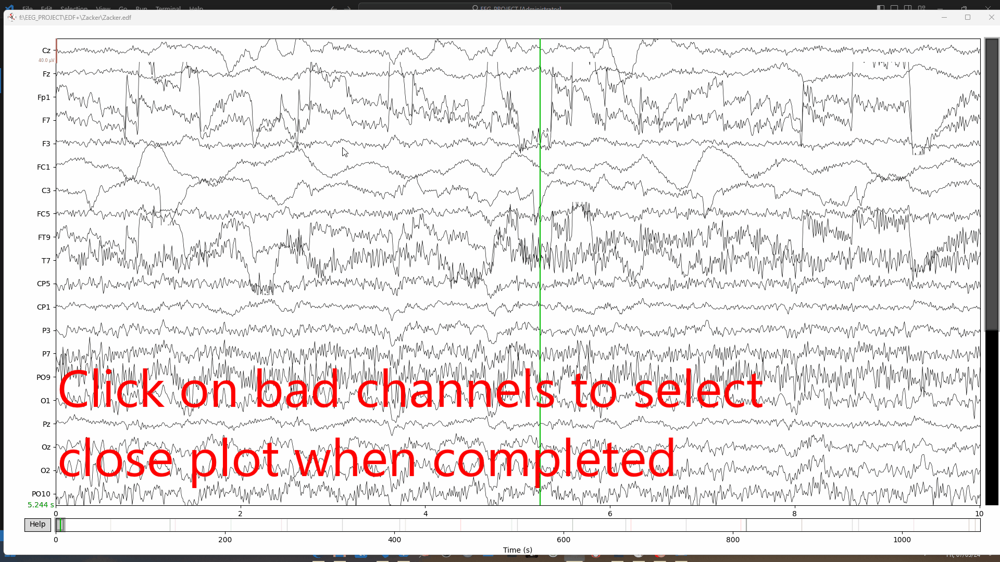

[interactively-interpolate-data](pre_process_interactively.py)